# Discovering Topic-Based Subreddit Communities

# Authors graph

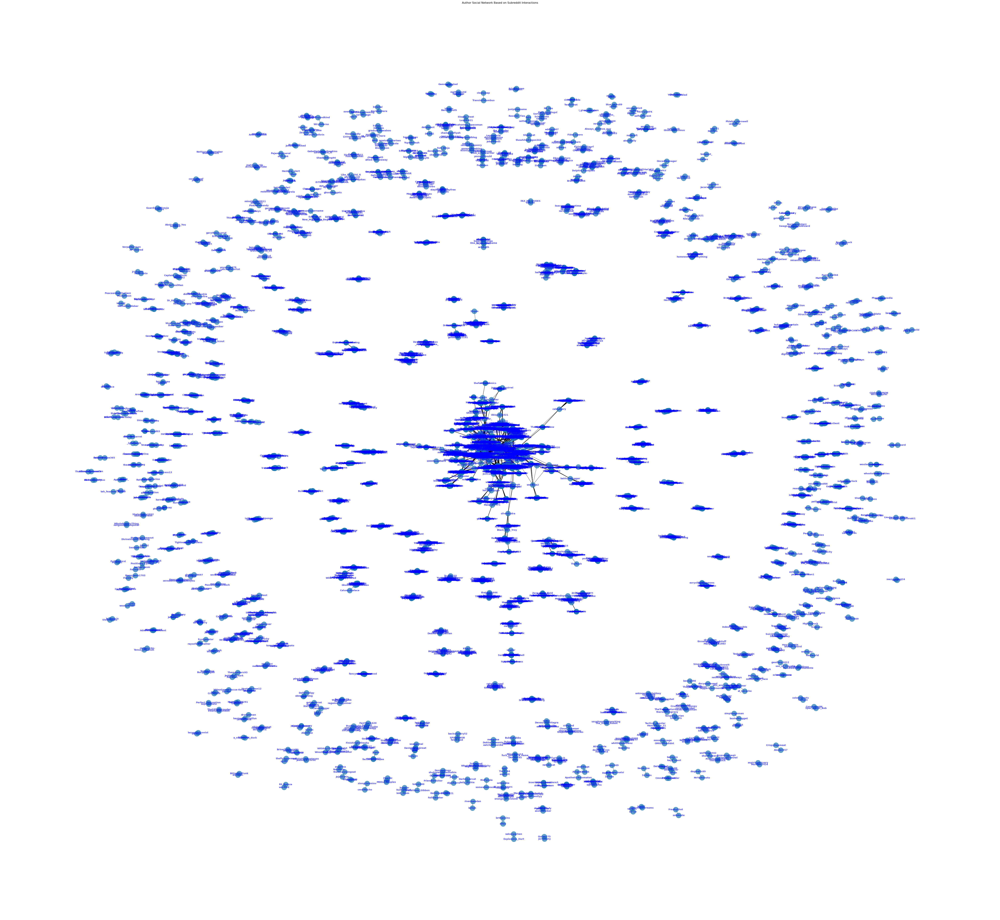

In [34]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.Graph()

# adding edges between authors who participated in the same subreddit
for subreddit in df['subreddit'].unique():
    authors = df[df['subreddit'] == subreddit]['author'].unique()
    edges = [(author1, author2) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    G.add_edges_from(edges)

# basic SNA metrics
degree_centrality = nx.degree_centrality(G)
clustering_coefficient = nx.clustering(G)

# draw the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(60, 55))
nx.draw(G, pos, with_labels=True, font_size=10, node_size=500, font_color='blue', font_weight='bold', alpha=0.7)

plt.title('Author Social Network Based on Subreddit Interactions')
plt.show()

In [36]:
# metrics
print(f"Number of Nodes: {G.number_of_nodes()}")
print(f"Number of Edges: {G.number_of_edges()}")
print(f"Average Degree: {sum(dict(G.degree()).values()) / G.number_of_nodes():.2f}")
print(f"Global Clustering Coefficient: {nx.average_clustering(G):.4f}")

# print degree centrality for each author
print("\nDegree Centrality:")
for author, centrality in degree_centrality.items():
    print(f"{author}: {centrality:.4f}")

# print clustering coefficient for each author
print("\nClustering Coefficient:")
for author, coefficient in clustering_coefficient.items():
    print(f"{author}: {coefficient:.4f}")

Number of Nodes: 8735
Number of Edges: 2297897
Average Degree: 526.14
Global Clustering Coefficient: 0.9436

Degree Centrality:
raysofdarkmatter: 0.0002
frustumator: 0.0002
vlts: 0.0002
Stork13: 0.0193
Mlion14: 0.0193
zerologics: 0.0193
NopeNotConor: 0.0193
gmorales87: 0.0193
MisterWonka: 0.0193
League_of_Nickelodeo: 0.0193
Adirael: 0.0193
atheistjubu: 0.0193
littlefuckface: 0.0193
mortaine: 0.0215
DancesWithDaleks: 0.2541
blacktoise: 0.0193
John_Duh: 0.0193
overmindthousand: 0.0193
architect_son: 0.0193
midnus: 0.0193
Sockpockets: 0.0193
Siethron: 0.0193
UnitedWeFail: 0.0193
N00btell4: 0.0193
s00pafly: 0.0193
A_Good_Soul: 0.0193
rosatter: 0.0193
goalkeepr: 0.0193
chinagreenelvis: 0.0193
kernelhappy: 0.0193
RobotNoah: 0.0193
jabberworx: 0.0193
DownvoteALot: 0.0193
oblivious1: 0.0193
draconiclyyours: 0.0193
Toof: 0.0193
honkerburger: 0.0193
kkkats: 0.0193
darthnadar: 0.0193
Lord_NiteShade: 0.0193
WonTheGame: 0.0193
SomeguyinLA: 0.0193
vocoders: 0.0193
thathat: 0.0193
SomeGuyIMetOnline: 

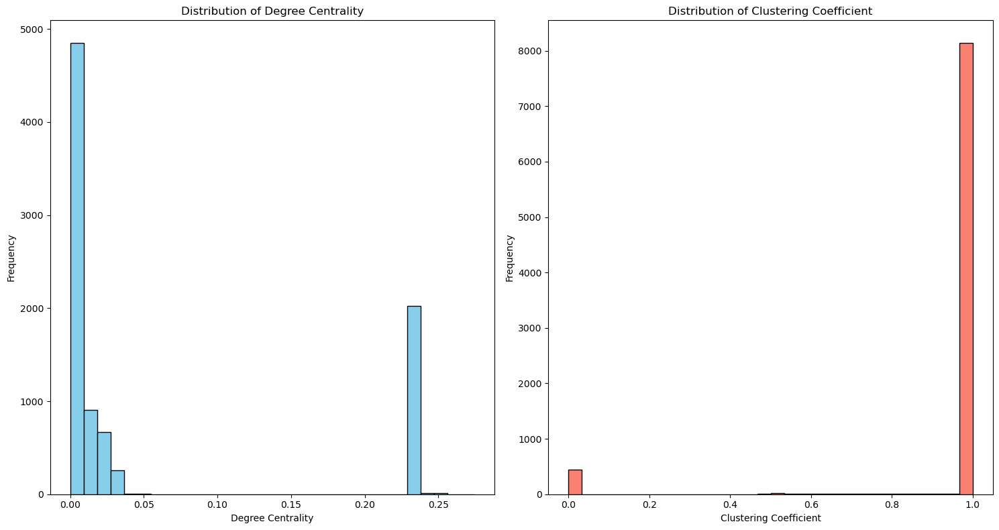

In [38]:

df_metrics = pd.DataFrame({
    'Degree Centrality': [degree_centrality[author] for author in G.nodes()],
    'Clustering Coefficient': [clustering_coefficient[author] for author in G.nodes()]
})

# plot histograms
plt.figure(figsize=(15, 8))

# histogram for Degree Centrality
plt.subplot(1, 2, 1)
plt.hist(df_metrics['Degree Centrality'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Degree Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')

# histogram for Clustering Coefficient
plt.subplot(1, 2, 2)
plt.hist(df_metrics['Clustering Coefficient'], bins=30, color='salmon', edgecolor='black')
plt.title('Distribution of Clustering Coefficient')
plt.xlabel('Clustering Coefficient')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


* Number of Nodes: 8735: There are 8735 authors in the network.
* Number of Edges: 2297897, The network has a high number of connections between authors.
* Average Degree: 526.14: On average, each author in the network is connected to approximately 526 other authors.
* Global Clustering Coefficient: 0.9436: this score indicates a strong local connectivity and the formation of dense clusters.
* The distribution of the clustering coefficient indicates the existence of numerous distinct communities within the network, because the frequency of higher score is 8000.


## Authors communities

In [60]:
# !pip install python-louvain --upgrade


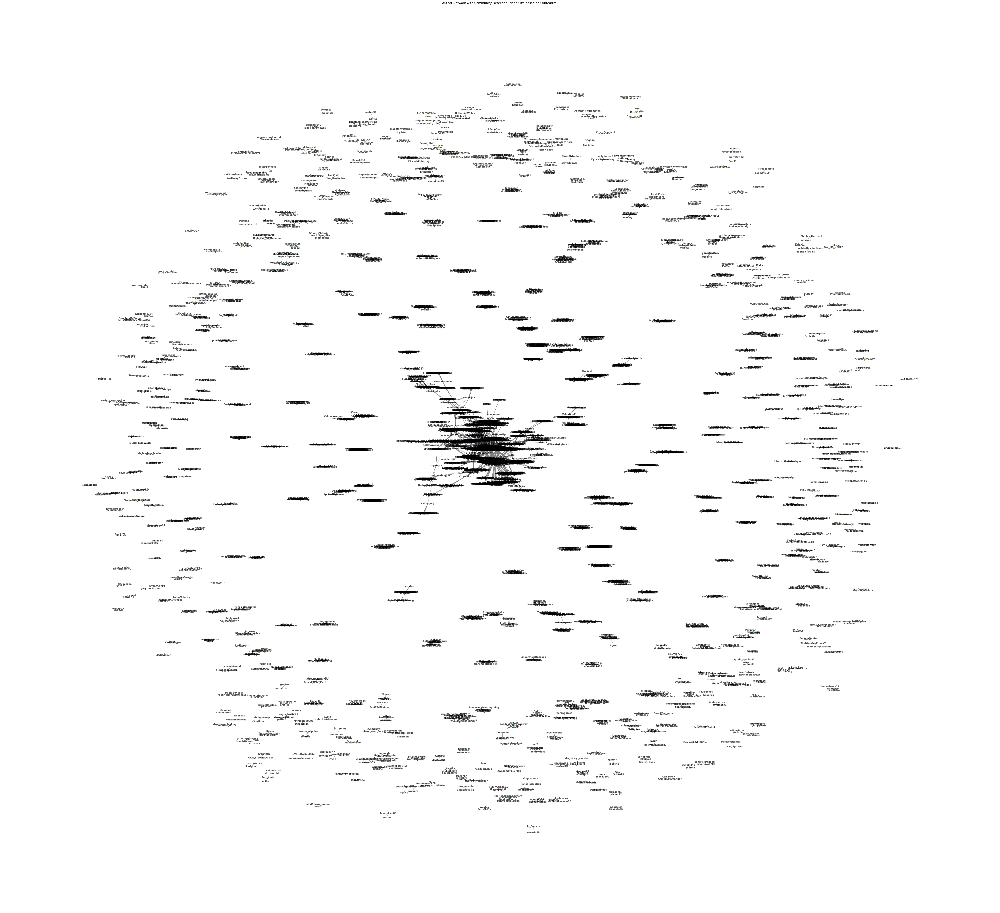

In [7]:
# create a graph for authors
A = nx.Graph()

# add edges between authors who participated in the same subreddit
for subreddit in df['subreddit'].unique():
    authors = df[df['subreddit'] == subreddit]['author'].unique()
    edges = [(author1, author2) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    A.add_edges_from(edges)

# apply Louvain community detection algorithm for authors
partition_authors = community_louvain.best_partition(A)

# assign community information to nodes in the graph
for node, community_id in partition_authors.items():
    A.nodes[node]['community_authors'] = community_id

# calculate node sizes based on the number of unique subreddits each author has participated in
node_sizes_authors = {author: len(df[df['author'] == author]['subreddit'].unique()) for author in A.nodes}

# generate a spring layout for better visualization
pos_authors = nx.spring_layout(A, seed=42)

# Plot the graph with node colors representing communities and node sizes based on subreddits
plt.figure(figsize=(55, 50))
node_colors_authors = [A.nodes[author]['community_authors'] for author in A.nodes]
nx.draw(A, pos_authors, with_labels=True, font_size=9, node_size=[node_sizes_authors[author] * 10 for author in A.nodes],
        node_color=node_colors_authors, cmap=plt.cm.get_cmap('viridis'), font_color='black', font_weight='bold',
        edge_color='gray', alpha=0.7)
plt.title('Author Network with Community Detection (Node Size based on Subreddits)')
plt.show()


## metrices of Authors communities graph

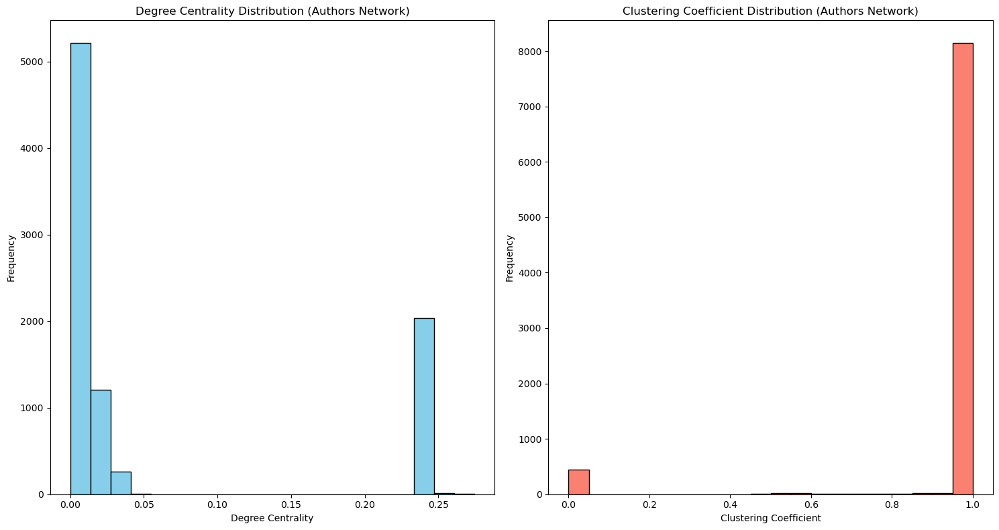

Number of authors: 8735
Average degree centrality: 526.1355
Average clustering coefficient: 0.9436
Density: 0.0602


In [8]:
import community

# Calculate basic SNA metrics for authors network
degree_centrality_authors = nx.degree_centrality(A)
clustering_coefficient_authors = nx.clustering(A)

df_metrics_authors = pd.DataFrame({
    'Author': list(A.nodes()),
    'Degree Centrality': [degree_centrality_authors[author] for author in A.nodes()],
    'Clustering Coefficient': [clustering_coefficient_authors[author] for author in A.nodes()]
})

# plot histograms for authors network metrics
plt.figure(figsize=(15, 8))

# histogram for Degree Centrality
plt.subplot(1, 2, 1)
plt.hist(df_metrics_authors['Degree Centrality'], bins=20, color='skyblue', edgecolor='black')
plt.title('Degree Centrality Distribution (Authors Network)')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')

# Histogram for Clustering Coefficient
plt.subplot(1, 2, 2)
plt.hist(df_metrics_authors['Clustering Coefficient'], bins=20, color='salmon', edgecolor='black')
plt.title('Clustering Coefficient Distribution (Authors Network)')
plt.xlabel('Clustering Coefficient')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

print("Number of authors:", len(A.nodes()))
print("Average degree centrality:", round(sum(dict(A.degree()).values()) / len(A.nodes()), 4))
print("Average clustering coefficient:", round(nx.average_clustering(A), 4))
print("Density:", round(nx.density(A), 4))


* Average Degree Centrality: 526.1355, on average, each author is connected to approximately 526 other authors, indicating a high degree of interconnectedness within the network.
* Average Clustering Coefficient: 0.9436, the high average clustering coefficient suggests that authors within communities tend to have strong local connections. The network contains dense clustering of authors.
* Density: 0.0602, the density indicates that the network has a relatively low density of connections compared to the maximum possible connections. This suggests that, while authors are highly interconnected within their communities, there are still areas of the network with fewer connections

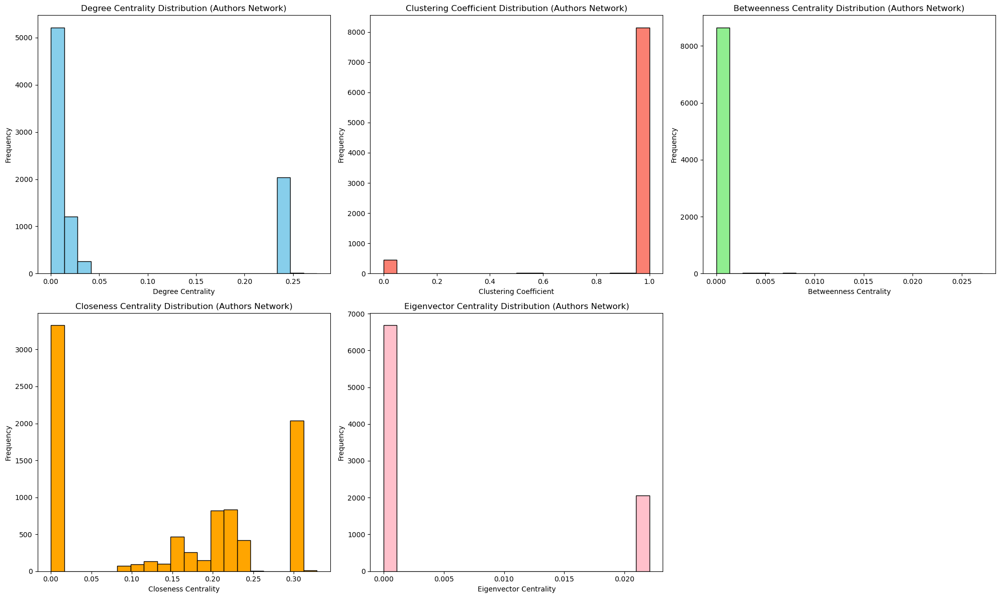

Number of authors: 8735
Average degree centrality: 526.1355
Average clustering coefficient: 0.9436
Density: 0.0602


In [13]:
# Calculate basic SNA metrics for authors network
degree_centrality_authors = nx.degree_centrality(A)
clustering_coefficient_authors = nx.clustering(A)
betweenness_centrality_authors = nx.betweenness_centrality(A)
closeness_centrality_authors = nx.closeness_centrality(A)
eigenvector_centrality_authors = nx.eigenvector_centrality(A)

# Create a DataFrame for visualization
df_metrics_authors = pd.DataFrame({
    'Author': list(A.nodes()),
    'Degree Centrality': [degree_centrality_authors[author] for author in A.nodes()],
    'Clustering Coefficient': [clustering_coefficient_authors[author] for author in A.nodes()],
    'Betweenness Centrality': [betweenness_centrality_authors[author] for author in A.nodes()],
    'Closeness Centrality': [closeness_centrality_authors[author] for author in A.nodes()],
    'Eigenvector Centrality': [eigenvector_centrality_authors[author] for author in A.nodes()]
})

# Plot histograms for authors network metrics
plt.figure(figsize=(20, 12))

# Histogram for Degree Centrality
plt.subplot(2, 3, 1)
plt.hist(df_metrics_authors['Degree Centrality'], bins=20, color='skyblue', edgecolor='black')
plt.title('Degree Centrality Distribution (Authors Network)')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')

# Histogram for Clustering Coefficient
plt.subplot(2, 3, 2)
plt.hist(df_metrics_authors['Clustering Coefficient'], bins=20, color='salmon', edgecolor='black')
plt.title('Clustering Coefficient Distribution (Authors Network)')
plt.xlabel('Clustering Coefficient')
plt.ylabel('Frequency')

# Histogram for Betweenness Centrality
plt.subplot(2, 3, 3)
plt.hist(df_metrics_authors['Betweenness Centrality'], bins=20, color='lightgreen', edgecolor='black')
plt.title('Betweenness Centrality Distribution (Authors Network)')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')

# Histogram for Closeness Centrality
plt.subplot(2, 3, 4)
plt.hist(df_metrics_authors['Closeness Centrality'], bins=20, color='orange', edgecolor='black')
plt.title('Closeness Centrality Distribution (Authors Network)')
plt.xlabel('Closeness Centrality')
plt.ylabel('Frequency')

# Histogram for Eigenvector Centrality
plt.subplot(2, 3, 5)
plt.hist(df_metrics_authors['Eigenvector Centrality'], bins=20, color='pink', edgecolor='black')
plt.title('Eigenvector Centrality Distribution (Authors Network)')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

print("Number of authors:", len(A.nodes()))
print("Average degree centrality:", round(sum(dict(A.degree()).values()) / len(A.nodes()), 4))
print("Average clustering coefficient:", round(nx.average_clustering(A), 4))
print("Density:", round(nx.density(A), 4))


# Subreddits graph

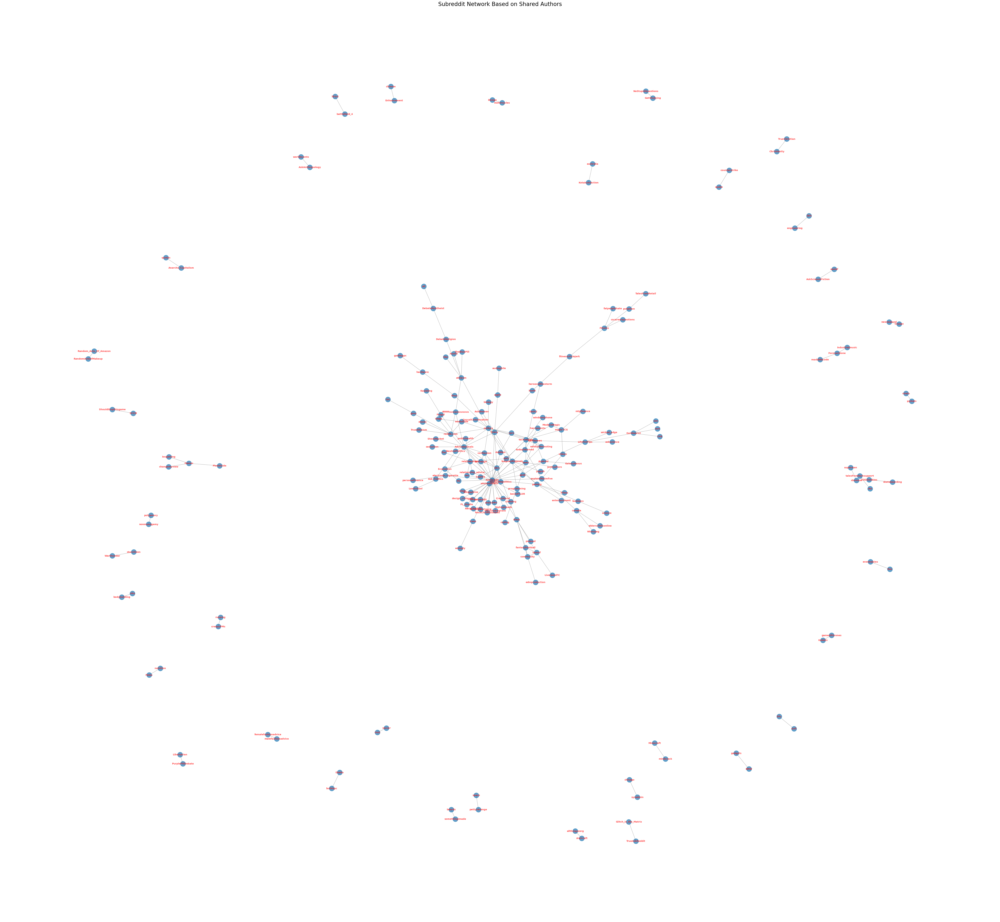

In [5]:
S = nx.Graph()

for subreddit in df['subreddit'].unique():
    authors = df[df['subreddit'] == subreddit]['author'].unique()
    edges = [(subreddit, other_subreddit) for other_subreddit in df[df['author'].isin(authors)]['subreddit'].unique() if subreddit != other_subreddit]
    S.add_edges_from(edges)

pos = nx.spring_layout(S, seed=42)
plt.figure(figsize=(60, 55))
nx.draw(S, pos, with_labels=True, font_size=10, node_size=500, font_color='red', font_weight='bold', edge_color='gray', alpha=0.7)

plt.title('Subreddit Network Based on Shared Authors', fontsize=24)

plt.show()

Number of communities: 41
Community assignments: {'fantasyfootball': 0, 'gaming': 0, 'canada': 0, 'techsupportgore': 0, 'Winnipeg': 0, 'explainlikeimfive': 0, 'wicked_edge': 0, 'Seattle': 0, 'community': 0, 'pics': 0, 'edmproduction': 0, 'WTF': 0, 'DebateAnAtheist': 0, 'CrazyHand': 0, 'personalfinance': 0, 'magicTCG': 0, 'LiverpoolFC': 0, 'relationships': 0, 'askseddit': 0, 'IAmA': 0, 'Android': 0, 'trees': 0, 'nba': 0, 'askgaybros': 0, 'programming': 0, 'mtgfinance': 0, 'worldnews': 0, 'Frugal': 0, 'FL_Studio': 0, 'climbing': 0, 'moderatepolitics': 0, 'leagueoflegends': 0, 'todayilearned': 0, 'technology': 0, 'hardware': 0, 'TwoXChromosomes': 0, 'CFB': 0, 'politics': 0, 'amiugly': 0, 'reddit.com': 0, 'ModernMagic': 0, 'Kayaking': 0, 'eu4': 0, 'Economics': 0, 'ABraThatFits': 0, 'seduction': 0, 'confession': 0, 'electronic_cigarette': 0, 'LifeProTips': 0, 'heroesofthestorm': 0, 'TheBluePill': 0, 'linux': 0, 'funny': 0, 'apple': 0, 'Sacramento': 0, 'elderscrollsonline': 0, 'askscience': 

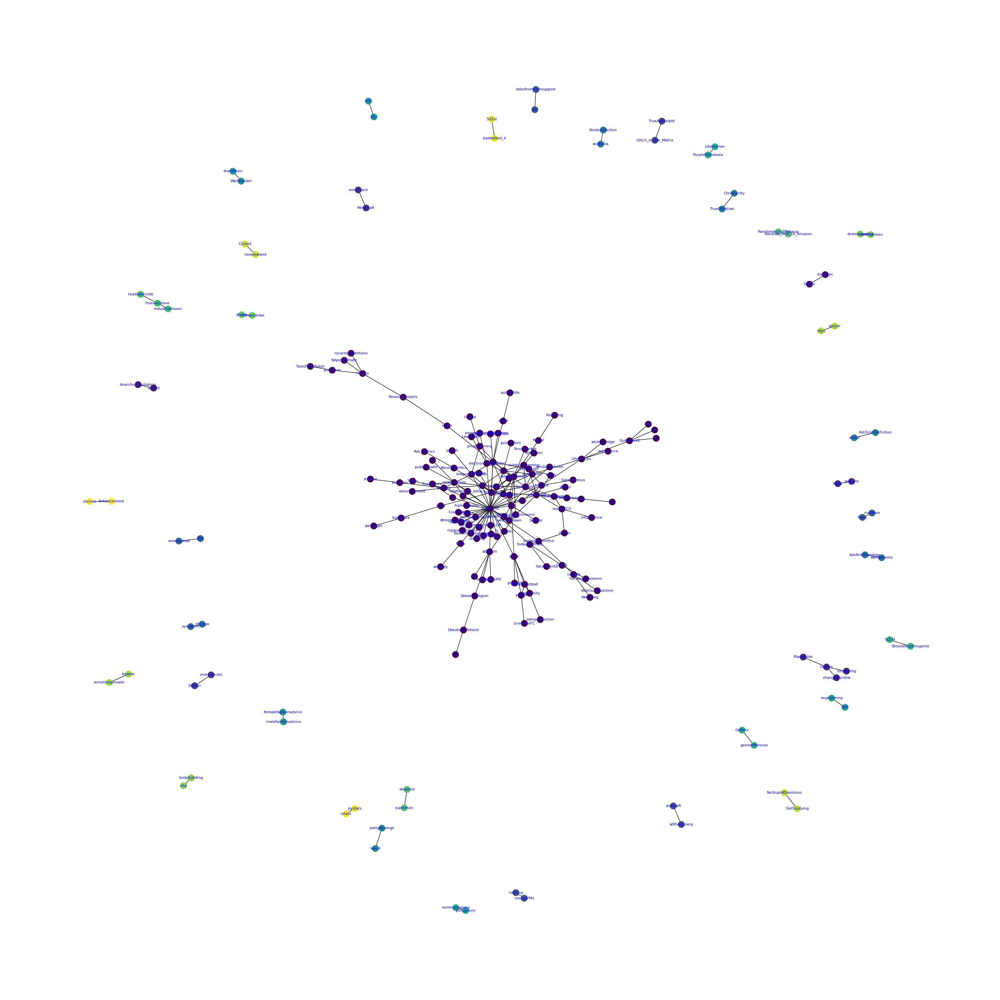

In [50]:
import networkx as nx
from networkx.algorithms.community import girvan_newman
import matplotlib.pyplot as plt

# Girvan-Newman community detection
communities_generator = girvan_newman(S)
top_level_communities = next(communities_generator)
community_assignments = {node: i for i, nodes in enumerate(top_level_communities) for node in nodes}

print("Number of communities:", len(set(community_assignments.values())))
print("Community assignments:", community_assignments)

pos = nx.spring_layout(S)

options = {
    "node_size": 200,
    "font_size": 8,
    "with_labels": True,
    "font_color": "blue",
    "node_color": [community_assignments[node] for node in S.nodes],
    "cmap": plt.cm.viridis,
    "linewidths": 0.5,
}

plt.figure(figsize=(30, 30))
nx.draw(S, pos, **options)
plt.savefig("community2.png", format="PNG")
plt.show()

In [52]:
from networkx.algorithms.community import modularity

modularity_value = modularity(S, top_level_communities)
print("Modularity of the girvan_newman algorithm:", modularity_value)

Modularity of the girvan_newman algorithm: 0.4000696300622175


Number of nodes (subreddits): 202
Number of edges: 211
Average degree: 2.09
Average clustering coefficient: 0.0878
Density: 0.0104


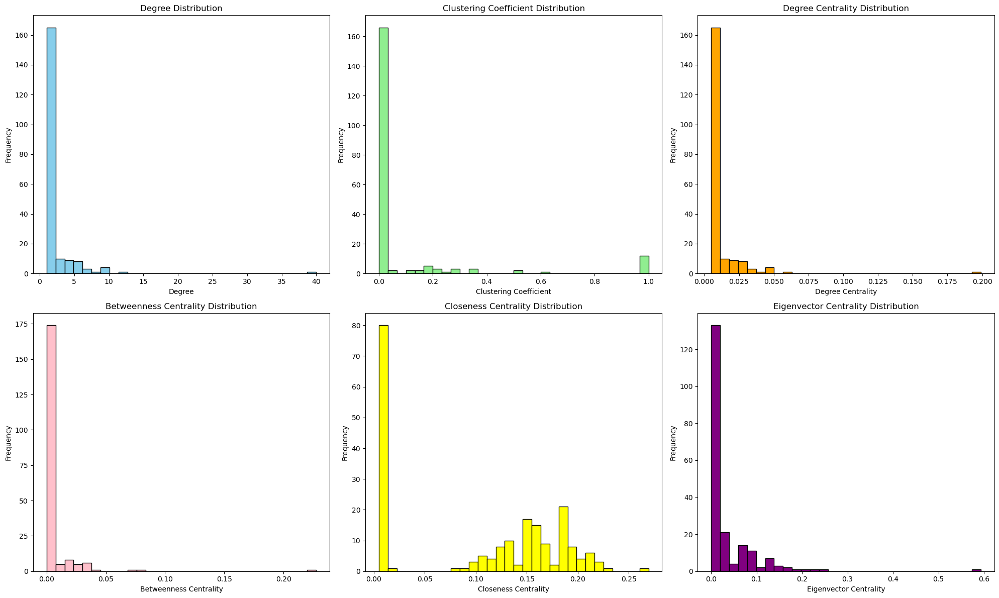

In [10]:
# calculate and print basic network metrics
print("Number of nodes (subreddits):", S.number_of_nodes())
print("Number of edges:", S.number_of_edges())
print("Average degree:", round(sum(dict(S.degree()).values()) / S.number_of_nodes(), 2))
print("Average clustering coefficient:", round(nx.average_clustering(S), 4))
print("Density:", round(nx.density(S), 4))

# Calculate metrics
degrees = dict(S.degree())
clustering_coefficients = nx.clustering(S)
degree_centrality = nx.degree_centrality(S)
betweenness_centrality = nx.betweenness_centrality(S)
closeness_centrality = nx.closeness_centrality(S)
eigenvector_centrality = nx.eigenvector_centrality(S)

plt.figure(figsize=(20, 12))

# Subplot for degree distribution
plt.subplot(2, 3, 1)
plt.hist(list(degrees.values()), bins=30, color='skyblue', edgecolor='black')
plt.title('Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Frequency')

# Subplot for clustering coefficient distribution
plt.subplot(2, 3, 2)
plt.hist(list(clustering_coefficients.values()), bins=30, color='lightgreen', edgecolor='black')
plt.title('Clustering Coefficient Distribution')
plt.xlabel('Clustering Coefficient')
plt.ylabel('Frequency')

# Subplot for degree centrality distribution
plt.subplot(2, 3, 3)
plt.hist(list(degree_centrality.values()), bins=30, color='orange', edgecolor='black')
plt.title('Degree Centrality Distribution')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')

# Subplot for betweenness centrality distribution
plt.subplot(2, 3, 4)
plt.hist(list(betweenness_centrality.values()), bins=30, color='pink', edgecolor='black')
plt.title('Betweenness Centrality Distribution')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')

# Subplot for closeness centrality distribution
plt.subplot(2, 3, 5)
plt.hist(list(closeness_centrality.values()), bins=30, color='yellow', edgecolor='black')
plt.title('Closeness Centrality Distribution')
plt.xlabel('Closeness Centrality')
plt.ylabel('Frequency')

# Subplot for eigenvector centrality distribution
plt.subplot(2, 3, 6)
plt.hist(list(eigenvector_centrality.values()), bins=30, color='purple', edgecolor='black')
plt.title('Eigenvector Centrality Distribution')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [11]:
# Calculate and print basic network metrics
print("Number of nodes (subreddits):", S.number_of_nodes())
print("Number of edges:", S.number_of_edges())
print("Average degree:", round(sum(dict(S.degree()).values()) / S.number_of_nodes(), 2))
print("Average clustering coefficient:", round(nx.average_clustering(S), 4))
print("Density:", round(nx.density(S), 4))

# Calculate metrics
degrees = dict(S.degree())
clustering_coefficients = nx.clustering(S)
degree_centrality = nx.degree_centrality(S)
betweenness_centrality = nx.betweenness_centrality(S)
closeness_centrality = nx.closeness_centrality(S)
eigenvector_centrality = nx.eigenvector_centrality(S)

# Print metrics
print("\nNode-Level Metrics:")
for subreddit in S.nodes():
    print(f"{subreddit}:")
    print(f"  - Degree: {degrees[subreddit]}")
    print(f"  - Clustering Coefficient: {clustering_coefficients[subreddit]}")
    print(f"  - Degree Centrality: {degree_centrality[subreddit]}")
    print(f"  - Betweenness Centrality: {betweenness_centrality[subreddit]}")
    print(f"  - Closeness Centrality: {closeness_centrality[subreddit]}")
    print(f"  - Eigenvector Centrality: {eigenvector_centrality[subreddit]}")
    print("\n")

print("Global Metrics:")
print(f"  - Global Clustering Coefficient: {nx.average_clustering(S)}")
print(f"  - Diameter: {nx.diameter(S)}")

Number of nodes (subreddits): 202
Number of edges: 211
Average degree: 2.09
Average clustering coefficient: 0.0878
Density: 0.0104

Node-Level Metrics:
funny:
  - Degree: 10
  - Clustering Coefficient: 0.1111111111111111
  - Degree Centrality: 0.04975124378109452
  - Betweenness Centrality: 0.07174643557106253
  - Closeness Centrality: 0.2288875113251633
  - Eigenvector Centrality: 0.20181947880451184


apple:
  - Degree: 2
  - Clustering Coefficient: 0
  - Degree Centrality: 0.009950248756218905
  - Betweenness Centrality: 0.005920398009950248
  - Closeness Centrality: 0.16660881638320027
  - Eigenvector Centrality: 0.027248677323398668


AskReddit:
  - Degree: 40
  - Clustering Coefficient: 0.029487179487179487
  - Degree Centrality: 0.1990049751243781
  - Betweenness Centrality: 0.2276878917102796
  - Closeness Centrality: 0.2693300415217147
  - Eigenvector Centrality: 0.5931607196459558


AdviceAnimals:
  - Degree: 10
  - Clustering Coefficient: 0.2
  - Degree Centrality: 0.0497512

NetworkXError: Found infinite path length because the graph is not connected

In [12]:
import networkx as nx

# calculate metrics
degree_centrality = nx.degree_centrality(S)
betweenness_centrality = nx.betweenness_centrality(S)
eigenvector_centrality = nx.eigenvector_centrality(S)

# Identify the top influential nodes based on each metric
top_degree_centrality = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:5]
top_betweenness_centrality = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)[:5]
top_eigenvector_centrality = sorted(eigenvector_centrality, key=eigenvector_centrality.get, reverse=True)[:5]

# Print the results
print("Top Influential Nodes based on Degree Centrality:")
print(top_degree_centrality)

print("\nTop Influential Nodes based on Betweenness Centrality:")
print(top_betweenness_centrality)

print("\nTop Influential Nodes based on Eigenvector Centrality:")
print(top_eigenvector_centrality)


Top Influential Nodes based on Degree Centrality:
['AskReddit', 'politics', 'funny', 'AdviceAnimals', 'pics']

Top Influential Nodes based on Betweenness Centrality:
['AskReddit', 'politics', 'funny', 'reddit.com', 'atheism']

Top Influential Nodes based on Eigenvector Centrality:
['AskReddit', 'pics', 'AdviceAnimals', 'funny', 'confession']


Interpretation of the Social Network Analysis (SNA) metrics:

1. **Number of Nodes (Subreddits): 202**
   - This represents the total number of unique subreddits in your network.

2. **Number of Edges: 211**
   - An edge between two subreddits indicates a shared author. Therefore, you have 211 connections between different subreddits based on common authors.

3. **Average Degree: 2.09**
   - The average degree represents the average number of connections (edges) each subreddit has. In this case, each subreddit is, on average, connected to approximately 2 other subreddits.

4. **Average Clustering Coefficient: 0.0878**
   - The clustering coefficient measures the degree to which nodes in a network tend to cluster together. A value of 0.0878 suggests a relatively low level of clustering. In other words, subreddits in the network are not strongly interconnected in clusters.

5. **Density: 0.0104**
   - Density measures the proportion of realized connections to possible connections in the network. A density of 0.0104 indicates that only a small fraction of all possible connections between subreddits is realized. This suggests a relatively sparse or decentralized network.

# Communities graph

> ## Communities of subreddits with weights

C:\Users\admin\AppData\Local\Temp\ipykernel_10720\2396631966.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  node_color=node_colors, cmap=plt.cm.get_cmap('viridis'), font_color='black', font_weight='bold',


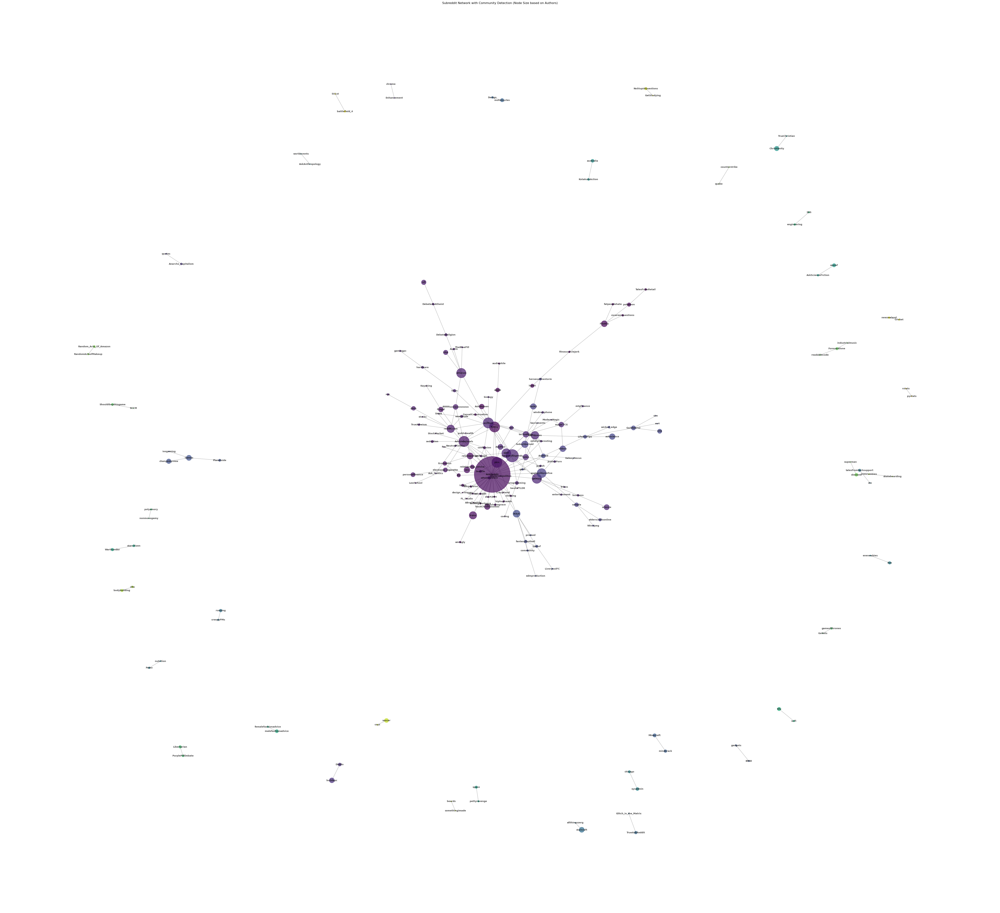

In [53]:
C = nx.Graph()

# Add edges between subreddits based on shared authors
for subreddit in df['subreddit'].unique():
    authors = df[df['subreddit'] == subreddit]['author'].unique()
    edges = [(subreddit, other_subreddit) for other_subreddit in df[df['author'].isin(authors)]['subreddit'].unique() if subreddit != other_subreddit]
    C.add_edges_from(edges)

# Apply community detection algorithm (Louvain method)
partition = community.best_partition(C)

# Assign community information to nodes in the graph
for node, community_id in partition.items():
    C.nodes[node]['community'] = community_id

# Calculate node sizes based on the number of unique authors in each subreddit
node_sizes = {subreddit: len(df[df['subreddit'] == subreddit]['author'].unique()) for subreddit in C.nodes}

pos = nx.spring_layout(C, seed=42)

# plot the graph with node colors representing communities and node sizes based on authors
plt.figure(figsize=(55, 50))
node_colors = [C.nodes[node]['community'] for node in C.nodes]
nx.draw(C, pos, with_labels=True, font_size=9, node_size=[node_sizes[node] * 10 for node in C.nodes],
        node_color=node_colors, cmap=plt.cm.get_cmap('viridis'), font_color='black', font_weight='bold',
        edge_color='gray', alpha=0.7)
plt.title('Subreddit Network with Community Detection (Node Size based on Authors)')
plt.show()


Number of communities: 47
Community assignments: {'funny': 0, 'apple': 0, 'AskReddit': 1, 'AdviceAnimals': 0, 'loseit': 2, 'woahdude': 3, 'leagueoflegends': 5, 'AskWomen': 0, 'CasualConversation': 0, 'politics': 5, 'pics': 0, 'gamingpc': 5, 'hardware': 5, 'Diablo': 6, 'buildapc': 6, 'audiophile': 0, 'atheism': 3, 'DebateReligion': 3, 'nba': 3, 'TheBluePill': 3, 'fffffffuuuuuuuuuuuu': 3, 'Austin': 3, 'quotes': 7, 'Anarcho_Capitalism': 7, 'todayilearned': 8, 'AskMen': 5, 'gaming': 5, 'relationships': 1, 'moderatepolitics': 0, 'FL_Studio': 1, 'whowouldwin': 0, 'techsupportgore': 1, 'WTF': 5, 'relationship_advice': 1, 'askgaybros': 1, 'explainlikeimfive': 8, 'confession': 0, 'news': 5, 'short': 1, 'ABraThatFits': 1, 'bestofTLDR': 1, 'archeage': 0, 'electronic_cigarette': 0, 'jobs': 1, 'hiphopheads': 1, 'sex': 1, 'CrazyHand': 1, 'rupaulsdragrace': 1, 'geek': 9, 'trees': 1, 'reddit.com': 3, 'design_critiques': 1, 'TwoXChromosomes': 1, 'IAmA': 10, 'comics': 1, 'tf2': 1, 'Android': 9, 'islam':

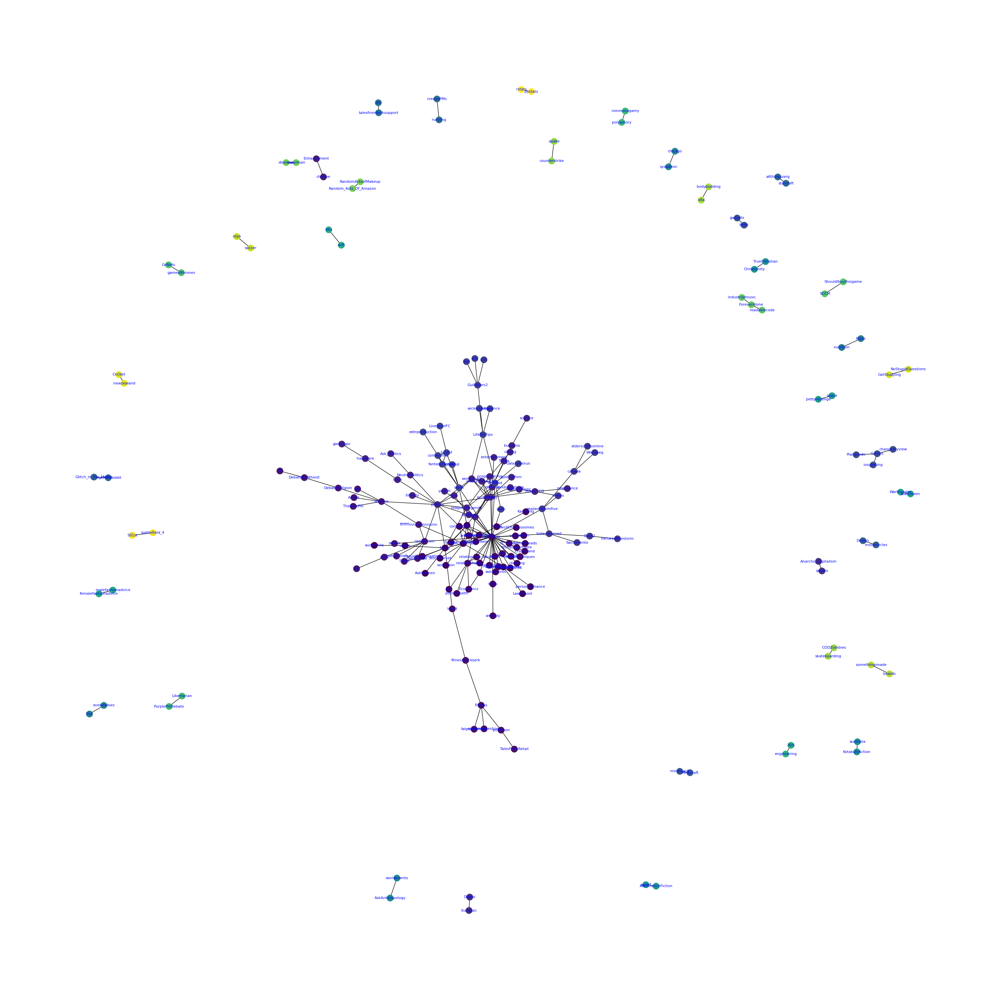

In [51]:
# Louvain community detection
partition = community.best_partition(S)

# Print the communities
print("Number of communities:", len(set(partition.values())))
print("Community assignments:", partition)

pos = nx.spring_layout(S)

# additional parameters for a cleaner visualization
options = {
    "node_size": 200,
    "font_size": 8,
    "with_labels": True,
    "font_color": "blue",
    "node_color": [partition[node] for node in S.nodes],
    "cmap": plt.cm.viridis,
    "linewidths": 0.5,
}

plt.figure(figsize=(30, 30))
nx.draw(S, pos, **options)
plt.savefig("community1.png", format="PNG")
plt.show()

In [49]:
modularity_value = community.modularity(partition, S)
print("Modularity of the Louvain algorithm:", modularity_value)

Modularity of the Louvain algorithm: 0.727431998382787


This score is indicative of a good community structure, there are well-defined
communities of subreddits with strong connections within each community.
This modularity score is high, and it reflects the effectiveness of the Louvain
algorithm in revealing cohesive and distinct thematic clusters among the
subreddits.

## Metrics of subreddits communities network

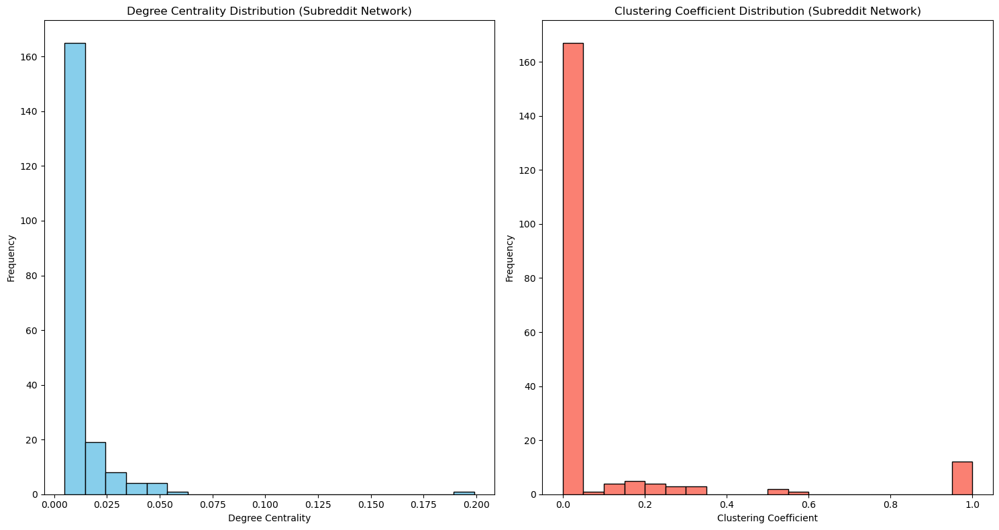

Number of subreddits: 202
Average degree centrality: 2.0891
Average clustering coefficient: 0.0878
Density: 0.0104


In [55]:
# Calculate basic SNA metrics for subreddit network
degree_centrality_subreddits = nx.degree_centrality(C)
clustering_coefficient_subreddits = nx.clustering(C)

df_metrics_subreddits = pd.DataFrame({
    'Subreddit': list(C.nodes()),
    'Degree Centrality': [degree_centrality_subreddits[subreddit] for subreddit in C.nodes()],
    'Clustering Coefficient': [clustering_coefficient_subreddits[subreddit] for subreddit in C.nodes()]
})

plt.figure(figsize=(15, 8))

# Histogram for Degree Centrality
plt.subplot(1, 2, 1)
plt.hist(df_metrics_subreddits['Degree Centrality'], bins=20, color='skyblue', edgecolor='black')
plt.title('Degree Centrality Distribution (Subreddit Network)')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')

# Histogram for Clustering Coefficient
plt.subplot(1, 2, 2)
plt.hist(df_metrics_subreddits['Clustering Coefficient'], bins=20, color='salmon', edgecolor='black')
plt.title('Clustering Coefficient Distribution (Subreddit Network)')
plt.xlabel('Clustering Coefficient')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

print("Number of subreddits:", len(C.nodes()))
print("Average degree centrality:", round(sum(dict(C.degree()).values()) / len(C.nodes()), 4))
print("Average clustering coefficient:", round(nx.average_clustering(C), 4))
print("Density:", round(nx.density(C), 4))



* Number of Subreddits (202): Indicates the diversity of subreddit communities within the network.
* Average Degree Centrality (2.0891): The average number of connections each subreddit has. A higher average degree centrality suggests a more interconnected network, with subreddits having, on average, more associations.
* Average Clustering Coefficient (0.0878): Reflects the extent of clustering or interconnectedness among neighboring subreddits. A higher coefficient implies that neighboring subreddits are more likely to share common connections. 
* Density (0.0104): Indicates the proportion of actual connections to possible connections. A low density suggests that the network is relatively sparse, with a significant number of potential connections yet to be established.